## Codes for JIA synovium study 
### TLS analysis

*Jun Inamo*

*jun.inamo@cuanschutz.edu*

*Computational Omics and Systems Immunology (COSI) Lab, Division of Rheumatology and Center for Health AI, University of Colorado School of Medicine, CO, USA*


In [1]:
format(Sys.Date(), "%Y-%m-%d")

[1] "2025-07-09"

In [2]:
options(warn = -1)  
options("verbose" = FALSE)
options("show.error.messages" = TRUE)  
Sys.setlocale("LC_CTYPE", "en_US.UTF-8")

[1] "en_US.UTF-8"

In [3]:
suppressMessages({
    source("./utils.R")
    library(gridExtra)
})

Load Seurat object of QCed data

In [4]:
ste = readRDS(paste0("./output/Xenium_merged_final.rds"))
DefaultAssay(ste) = "SCT"

Assign annotated cluster names

In [5]:
celltype="ALL"
resolution <- switch(celltype,
                     "ALL" = "0.20",
                     "T" = "1.00",
                     "M" = "0.20",
                     "B" = "0.40",
                     "Tissue" = "0.60"
)

cluster_col = "res_subtype" 
Idents(ste) = factor(ste@meta.data[,cluster_col])
DefaultAssay(ste) = "SCT"

cluster_df = read.csv("./cluster_annotation.csv")

cluster_COLORS <- manual_colors[1:length(unique(Idents(ste)))]
names(cluster_COLORS) = levels(Idents(ste))

cur_levels <- levels(Idents(ste))
df <- data.frame(level = cur_levels, stringsAsFactors = FALSE)
df$prefix <- sub("^([^-]+)-.*", "\\1", df$level)
df$num <- as.integer(sub("^[^-]+-(\\d+):.*", "\\1", df$level))
prefix_order <- c("T", "B", "M", "Tissue")
df$prefix_factor <- factor(df$prefix, levels = prefix_order)
df_sorted <- df[order(df$prefix_factor, df$num), ]
new_levels <- df_sorted$level
Idents(ste) <- factor(Idents(ste), levels = new_levels)

T_grad <- colorRampPalette(c("#ACD9AE99", "#358A3999"))(25)
Tissue_grad <- colorRampPalette(c("#FFEBED99", "#B71B1B99"))(25)
B_grad <- colorRampPalette(c("#C8B9E599", "#311A9299"))(25)
M_grad <- colorRampPalette(c("gold", "goldenrod3"))(25)
cluster_COLORS_ = c(T_grad[1:length(grep("^T-",levels(Idents(ste))))],
                    B_grad[1:length(grep("^B-",levels(Idents(ste))))],
                    M_grad[1:length(grep("^M-",levels(Idents(ste))))],
                    Tissue_grad[1:length(grep("^Tissue-",levels(Idents(ste))))])
names(cluster_COLORS_) = levels(Idents(ste))
cluster_COLORS_[grepl("venule",names(cluster_COLORS_))] = "grey40"
cluster_COLORS_[grepl("arteriolar",names(cluster_COLORS_))] = "grey70"
cluster_COLORS_[grepl("lymphatic",names(cluster_COLORS_))] = "grey90"
cluster_COLORS_[grepl("mixed",names(cluster_COLORS_))] = "white"

clus = ste@meta.data[,cluster_col] %>% 
  unique() %>%
  stringr::str_split(.,pattern = ":", simplify = TRUE) %>%
  .[,2]
cluster_COLORS__ = manual_colors
names(cluster_COLORS__) = clus
cluster_COLORS__ = na.omit(cluster_COLORS__)

cluster_colors_df <- data.frame(
  cluster =  ste@meta.data[,cluster_col] %>% 
    unique(),
  color = cluster_COLORS__[!is.na(names(cluster_COLORS__))],
  stringsAsFactors = FALSE
)

cluster_colors_df$clean_name <- sub("^[^:]+:", "", cluster_colors_df$cluster)

cluster_colors_mod_df <- data.frame(
  cluster = names(cluster_COLORS_),
  color = cluster_COLORS_,
  stringsAsFactors = FALSE
)

cluster_colors_mod_df$clean_name <- sub("^[^:]+:", "", cluster_colors_mod_df$cluster)

replace_indices <- cluster_colors_df$clean_name %in% cluster_colors_df$clean_name

cluster_colors_df$color[replace_indices] <- cluster_colors_mod_df$color[match(cluster_colors_df$clean_name[replace_indices], cluster_colors_mod_df$clean_name)]

cluster_COLORS__ <- setNames(cluster_colors_df$color, cluster_colors_df$clean_name)


ste@meta.data$new_cluster = factor(stringr::str_split(ste@meta.data$res_subtype,pattern=":",simplify=TRUE)[,2], 
                                   levels = unique(stringr::str_split(levels(Idents(ste)),pattern=":",simplify=TRUE)[,2])) 
Idents(ste) = ste@meta.data$new_cluster

ord = levels(Idents(ste))
ord = c(ord[!grepl("venule|arteriolar|lymphatic|mixed",ord)],
        ord[grepl("venule|arteriolar|lymphatic|mixed",ord)])
Idents(ste) = factor(Idents(ste), levels = ord)
ord = levels(Idents(ste))
ord = c(ord[!grepl("mixed",ord)],
        ord[grepl("mixed",ord)])
Idents(ste) = factor(Idents(ste), levels = ord)

cluster_COLORS__ = cluster_COLORS__[levels(Idents(ste))]
cluster_COLORS__tmp = cluster_COLORS__
names(cluster_COLORS__tmp) = c("CD4 naïve","CD4 memory","Treg","TPH_TFH","Th1-like Tph",
                               "CD8 naïve","GZMK+ CD8","GZMB+ CD8","IFN stimulated CD8 memory","TRM","Innate-like T",
                               "gdT",
                               "ILCs",
                               "NK cells",
                               "B","plasmablast","plasma",
                               "MERTK+ macrophage","TREM2+ macrophage","pro-inflammatory  macrophage","stressed macrophage",
                               "DC1","DC2","pDC","mregDC","mast cell",
                               "proliferating cells",
                               "PRG4+ lining fibroblast","PRG4+DKK3+ lining fibroblast",
                               "CXCL12+DKK3+ intermediate fibroblast","RSPO3+ intermediate fibroblast",
                               "POSTN+ sublining fibroblast","NOTCH3+ sublining fibroblast","CD34+PI16+DPP4+ sublining","CXCL12+ sublining fibroblast",
                               "muscle",
                               "venule","NOTCH4+ arteriolar","lymphatic",
                               "mixed")
cluster_COLORS__ = cluster_COLORS__tmp
cluster_COLORS__[names(cluster_COLORS__)=="NK cells"]="turquoise"
cluster_COLORS__[names(cluster_COLORS__)=="ILCs"]="darkblue"
Idents(ste) = factor(Idents(ste), levels = names(cluster_COLORS__))

cluster_col = "new_cluster"

In [6]:
table(Idents(ste))
sum(table(Idents(ste)))


                           CD4 naïve                           CD4 memory 
                                 624                                 5828 
                                Treg                              TPH_TFH 
                                2150                                 1828 
                        Th1-like Tph                            CD8 naïve 
                                 793                                 3425 
                           GZMK+ CD8                            GZMB+ CD8 
                                9680                                  477 
           IFN stimulated CD8 memory                                  TRM 
                                 794                                 1463 
                       Innate-like T                                  gdT 
                                 895                                 2210 
                                ILCs                             NK cells 
                        

[1] 430119

Use co-localization score for T and B cell subsets to identify TLS-candidate locations


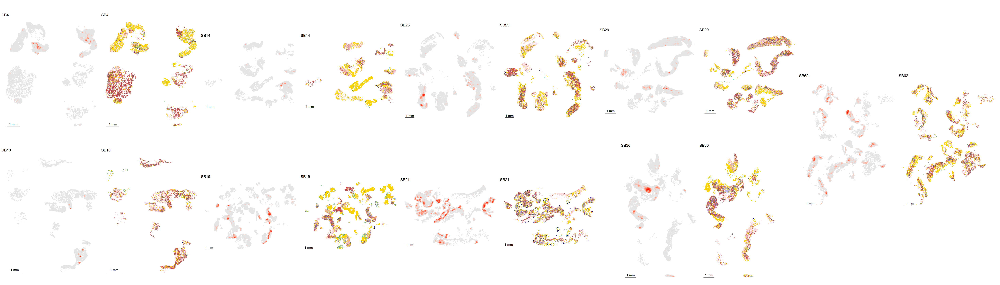

In [7]:
column_cooccur_score = "cooccur_local_B_T"

myplots = list()
for(sample_id_ in c("SB4","SB14","SB10","SB19","SB25","SB21","SB29","SB30","SB62")) {
  
  coords = ste[[sample_id_]]$centroids@coords %>%
    as.data.frame() %>%
    dplyr::mutate(cell = Cells(ste[[sample_id_]])) %>%
    dplyr::left_join(.,ste@meta.data %>%
                       .[,c("cell",column_cooccur_score)],by="cell") %>%
    dplyr::arrange(.data[[column_cooccur_score]])
  g1 = ggplot(coords, aes(x = y, y = x, color = .data[[column_cooccur_score]]) ) +
    geom_point_rast(size = 0.01) +
    scale_color_gradient(low = "grey90", high = "red") +
    coord_fixed() +
    annotate("segment", x = min(coords$y) + 50, xend = min(coords$y) + 1050, 
             y = min(coords$x) - 50, yend = min(coords$x) - 50, 
             color = "black", size = 0.5) +
    annotate("text", x = min(coords$y) + 550, y = min(coords$x) + 150, 
             label = "1 mm", size = 4) +
    theme_void() +
    theme(legend.position = "none") +
    ggtitle(paste0(sample_id_))
  
  coords = ste[[sample_id_]]$centroids@coords %>%
    as.data.frame() %>%
    dplyr::mutate(cell = Cells(ste[[sample_id_]])) %>%
    dplyr::left_join(.,ste@meta.data %>%
                       .[,c("cell",cluster_col)],by="cell")
  g2 = ggplot(coords, aes(x = y, y = x, color = .data[[cluster_col]]) ) +
    geom_point_rast(size = 0.01) +
    scale_color_manual(values = cluster_COLORS__) +
    coord_fixed() +
    annotate("segment", x = min(coords$y) + 50, xend = min(coords$y) + 1050, 
             y = min(coords$x) - 50, yend = min(coords$x) - 50, 
             color = "black", size = 0.5) +
    annotate("text", x = min(coords$y) + 550, y = min(coords$x) + 150, 
             label = "1 mm", size = 4) +
    theme_void() +
    theme(legend.position = "none") +
    ggtitle(paste0(sample_id_))
  
  
  #plot((g1 | g2))
  myplots[[sample_id_]] = (g1 | g2)
}

options(repr.plot.width = 49, repr.plot.height = 14)
(myplots[["SB4"]] / myplots[["SB10"]]) | (myplots[["SB14"]] / myplots[["SB19"]]) | (myplots[["SB25"]] / myplots[["SB21"]]) | (myplots[["SB29"]] / myplots[["SB30"]]) | myplots[["SB62"]]




CXCL13-CXCR5 signal

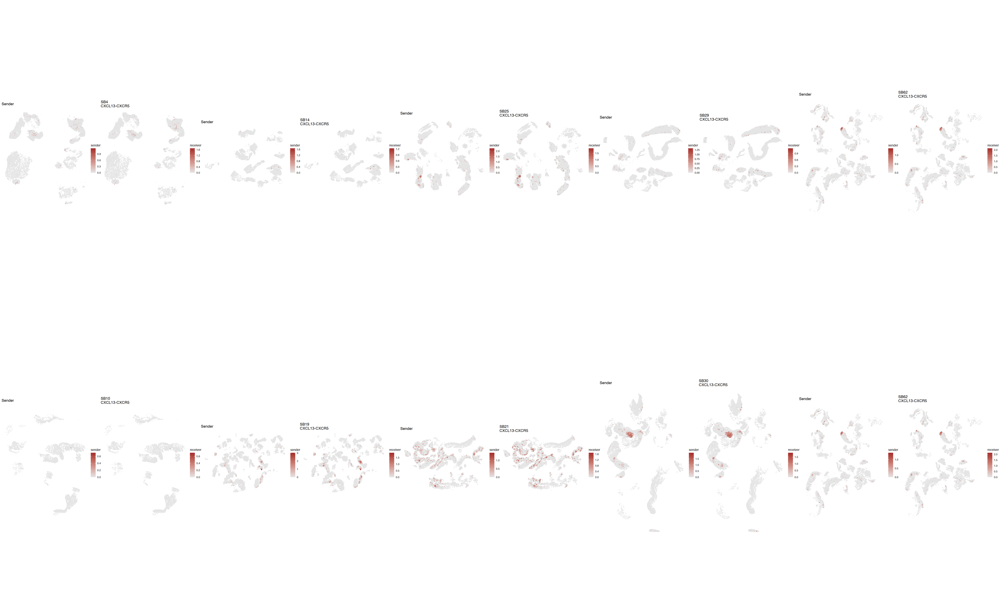

In [8]:
pathwayName="CXCL13-CXCR5"
myplots = list()
for(sample_id_ in c("SB4","SB14","SB10","SB19","SB25","SB21","SB29","SB30","SB62")) {
  
  sce = readRDS(paste0("./output/COMMOT_",sample_id_,"_withoutObsp.rds"))
  
  g_sender = data.frame(reducedDims(sce)[["spatial"]],
                        sender = reducedDims(sce)[["commot.user_database.sum.sender"]][,paste0('s-',pathwayName)],
                        receiver = reducedDims(sce)[["commot.user_database.sum.receiver"]][,paste0('r-',pathwayName)]) %>%
    dplyr::arrange(sender) %>%
    magrittr::set_colnames(c('imagecol','imagerow','sender','receiver')) %>%
    ggplot(aes(x = imagerow, y = imagecol, color = sender)) +
    geom_point_rast(size = 0.01) +
    scale_color_gradient(low = "grey90", high = "brown") +
    coord_fixed() +
    theme_void() +
    labs(title = "Sender")
  g_receiver = data.frame(reducedDims(sce)[["spatial"]],
                          sender = reducedDims(sce)[["commot.user_database.sum.sender"]][,paste0('s-',pathwayName)],
                          receiver = reducedDims(sce)[["commot.user_database.sum.receiver"]][,paste0('r-',pathwayName)]) %>%
    dplyr::arrange(receiver) %>%
    magrittr::set_colnames(c('imagecol','imagerow','sender','receiver')) %>%
    ggplot(aes(x = imagerow, y = imagecol, color = receiver)) +
    geom_point_rast(size = 0.01) +
    scale_color_gradient(low = "grey90", high = "brown") +
    coord_fixed() +
    theme_void() +
    labs(title = "Receiver")
  g = (g_sender | g_receiver) + ggtitle(paste0(sample_id_,"\n",pathwayName))

  myplots[[sample_id_]] = g
}

options(repr.plot.width = 49, repr.plot.height = 30)
(myplots[["SB4"]] / myplots[["SB10"]]) | (myplots[["SB14"]] / myplots[["SB19"]]) | (myplots[["SB25"]] / myplots[["SB21"]]) | (myplots[["SB29"]] / myplots[["SB30"]]) | (myplots[["SB62"]] / myplots[["SB62"]])




Visualize identified TLS regions

In [9]:

n_min = 20
radius = 50
neighbors.k = 200
column_cooccur_score = "cooccur_local_B_T" 

target_cluster = unique(stringr::str_split(grep("^T-|^B-",unique(ste@meta.data[,"res_subtype"]),value = T),pattern=":",simplify=TRUE)[,2])
cell_id = Cells(ste)[ste@meta.data[,column_cooccur_score]>0]

tls_df = data.frame()
for (name in c("SB4","SB14","SB10","SB19","SB25","SB21","SB29","SB30","SB62")) {
  tls_df_ = search_TLS(seurat_object = ste,
                       fov = name,
                       radius = radius,
                       n_min = n_min,
                       neighbors.k = neighbors.k,
                       cell_id = cell_id)
  tls_df = rbind(tls_df,
                 tls_df_)
  
}
tls_df = as.data.frame(tls_df)
head(tls_df)


,cell_id,x,y,cluster_id,celltype,x_min,x_max,y_min,y_max,n_all_cells,n_minclu_cells,sample_id
,<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<chr>
1,SB4_ahanmfbi-1,7151.450,6128.849,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917,56,SB4
2,SB4_ahdoapmb-1,7038.790,6031.688,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917,56,SB4
3,SB4_ahecampl-1,7051.414,6047.616,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917,56,SB4
4,SB4_ahecmgda-1,7049.578,6025.897,SB4:TLS-cluster7,M,6911.603,7579.947,5995.073,6472.643,917,56,SB4
5,SB4_aheedlod-1,7041.330,6025.482,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917,56,SB4
6,SB4_ahehihfd-1,7086.972,6082.307,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917,56,SB4


[1] "SB21:TLS-cluster61"


Registered S3 methods overwritten by 'proxy':
  method               from    
  print.registry_field registry
  print.registry_entry registry



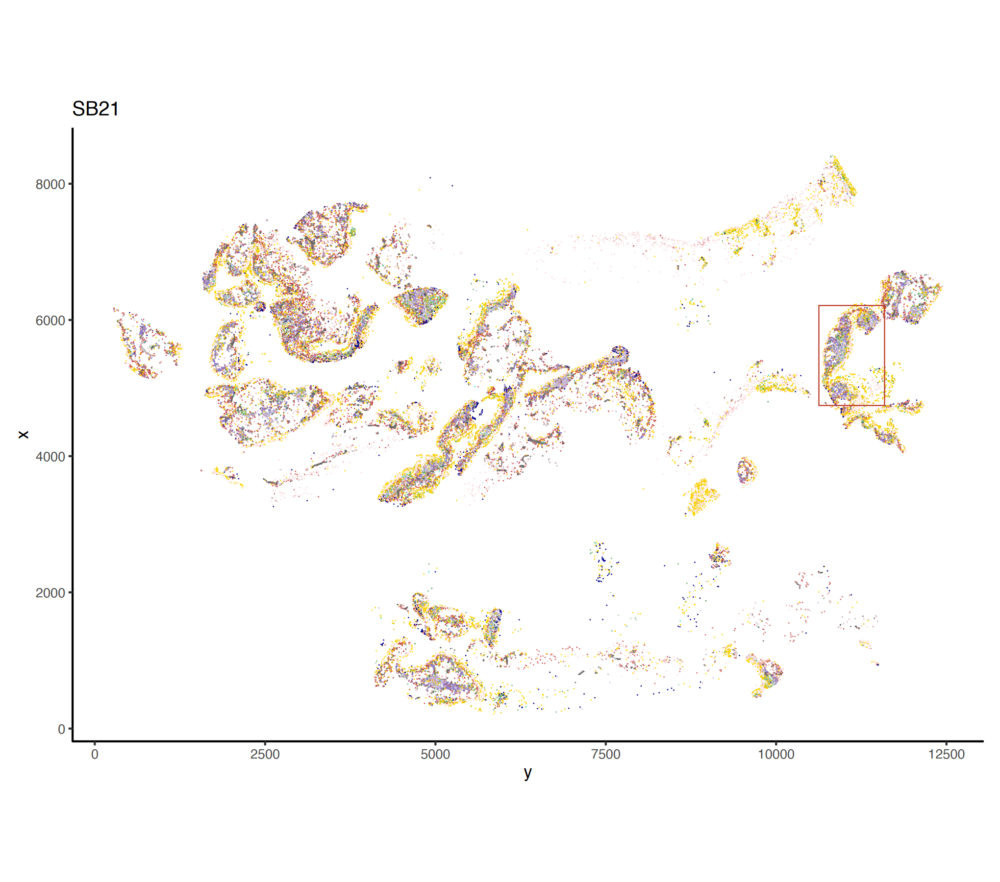

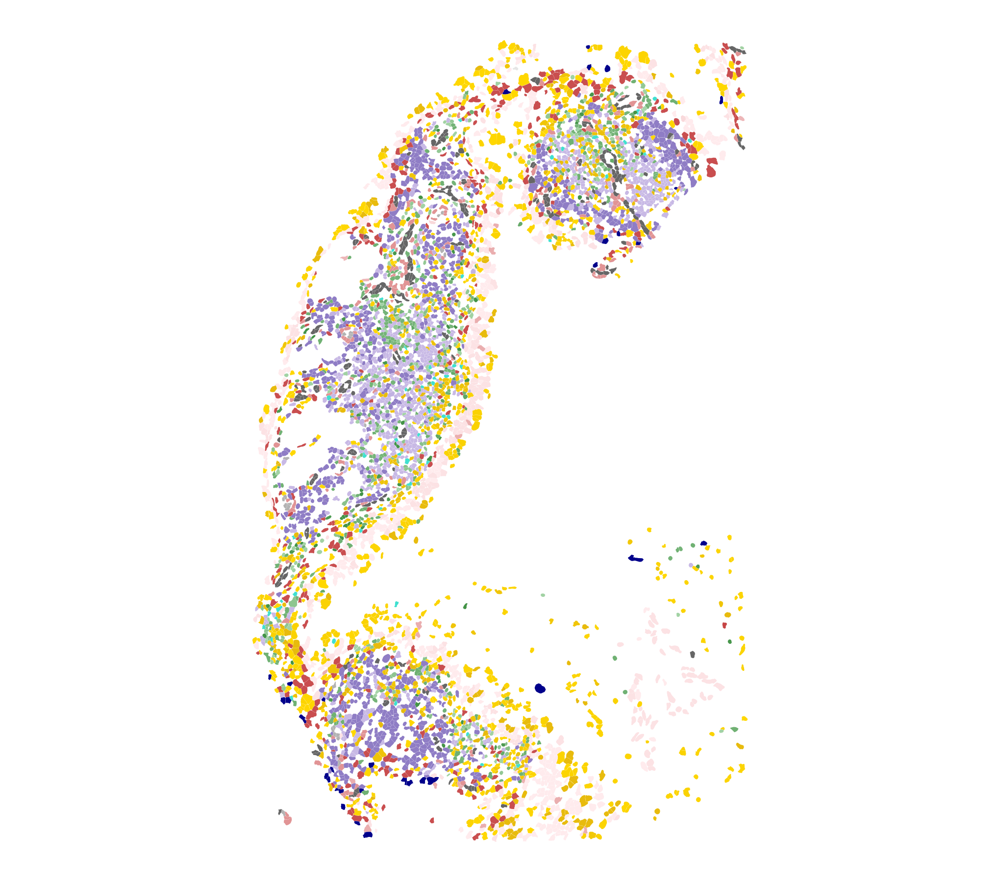

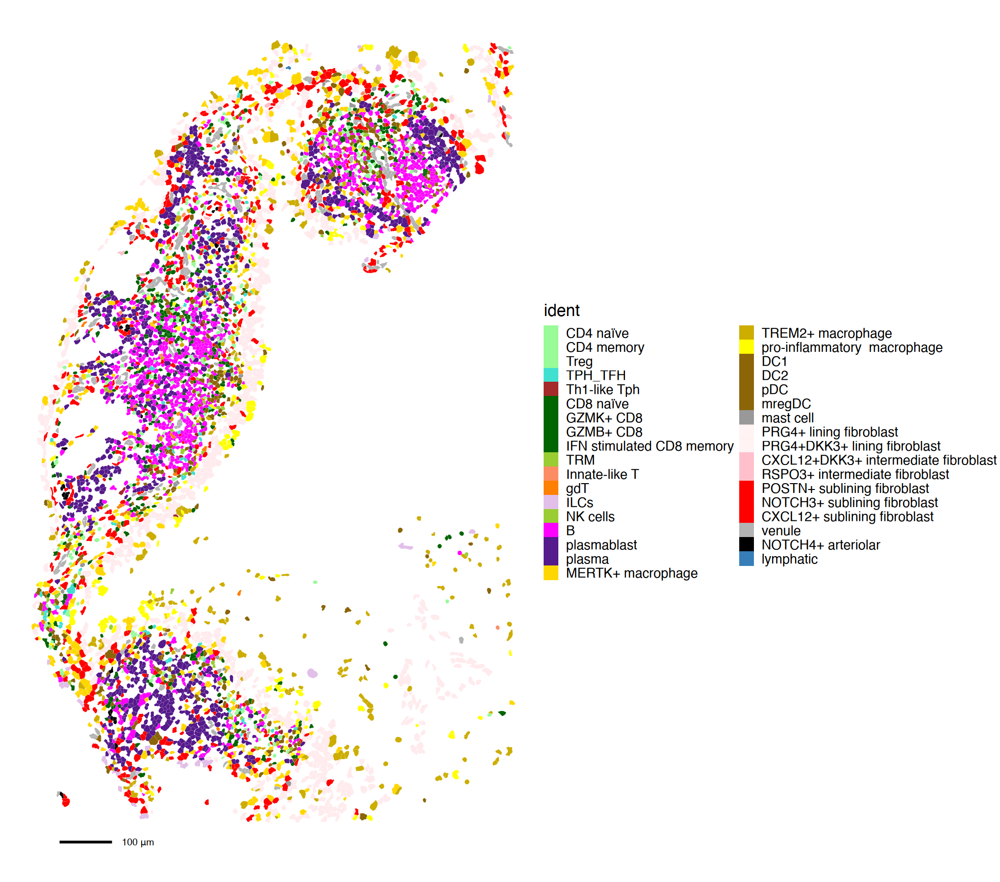

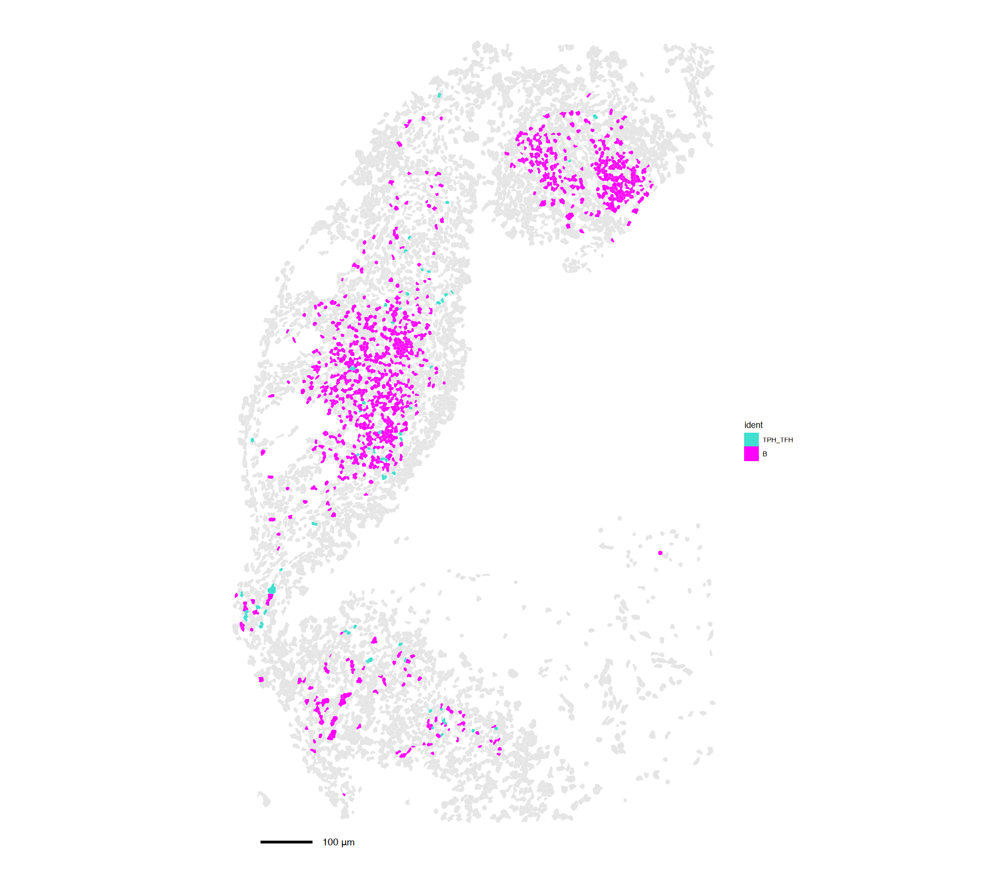

[1] "SB21:TLS-cluster40"


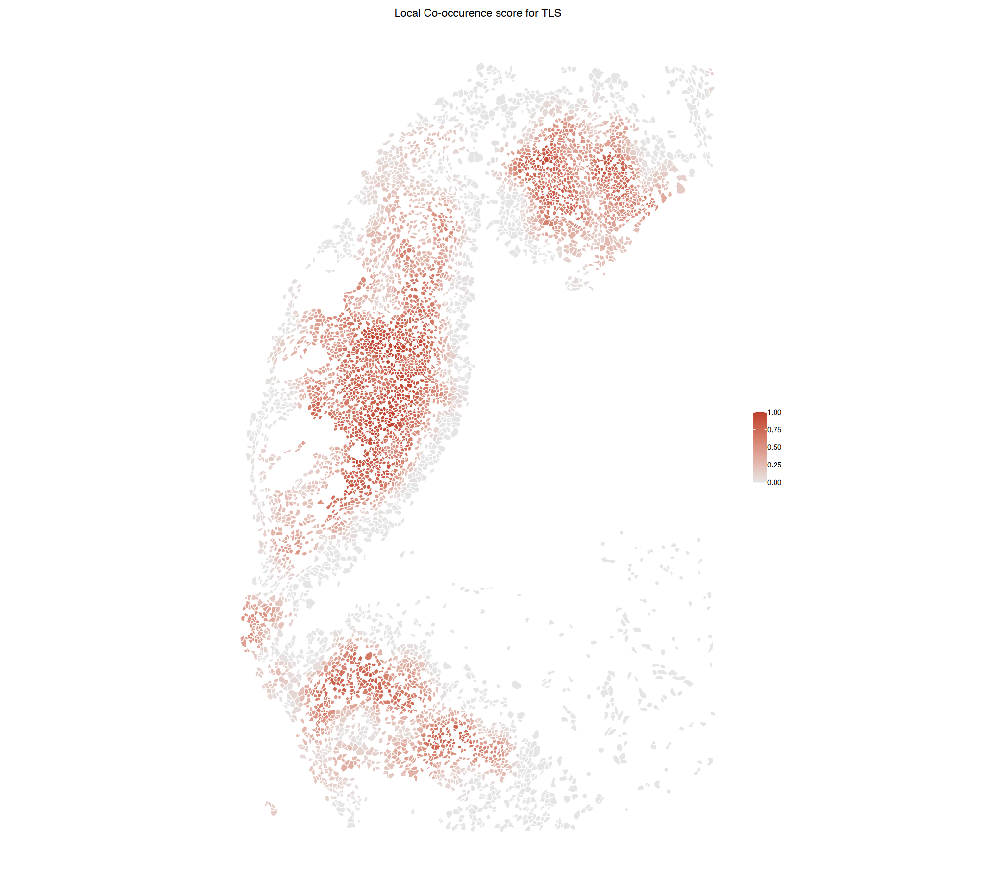

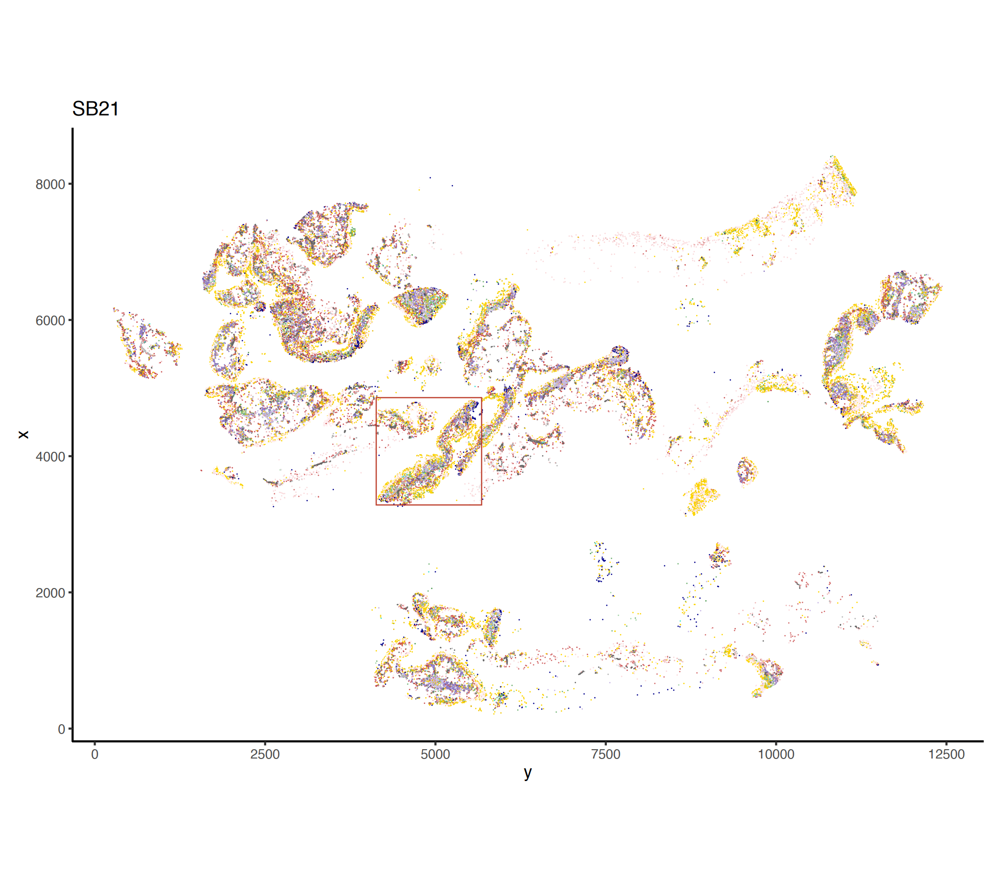

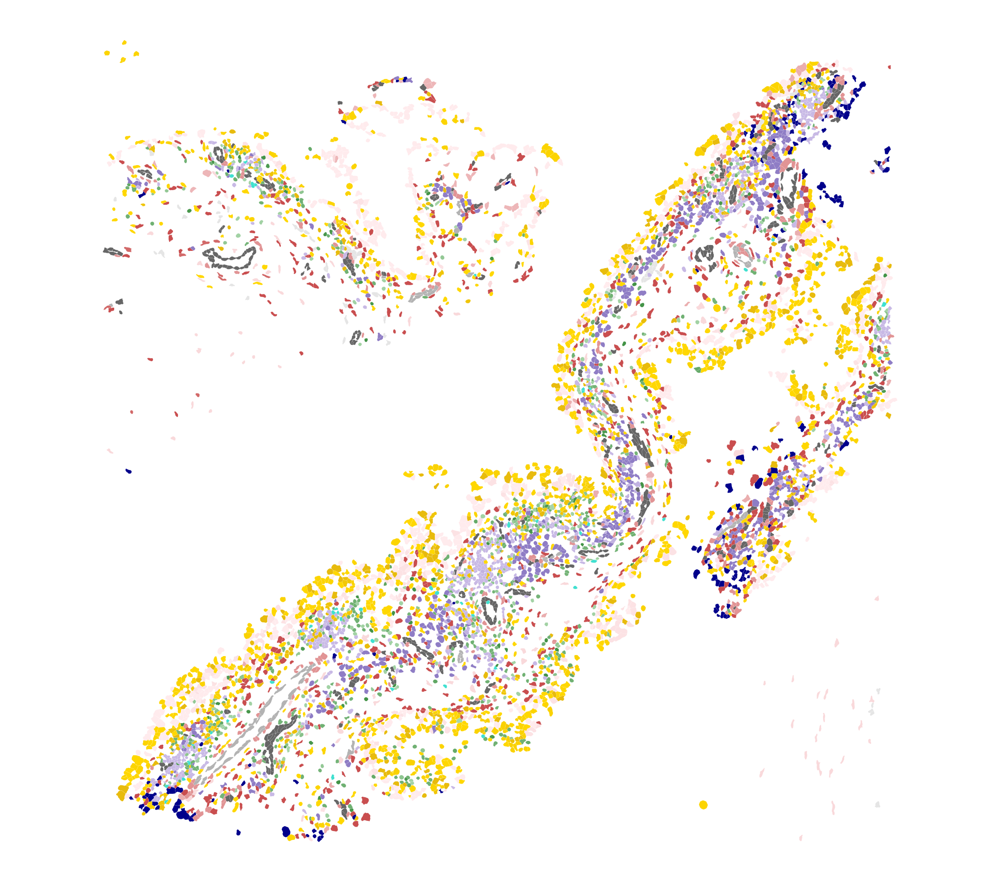

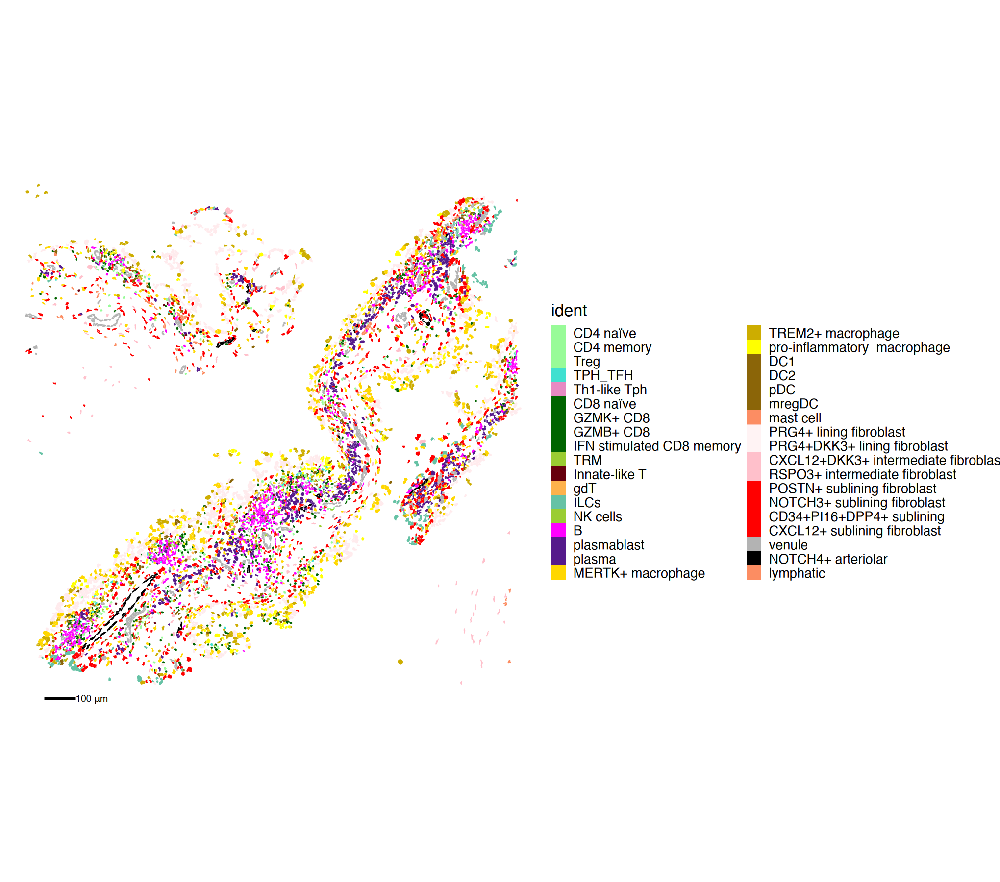

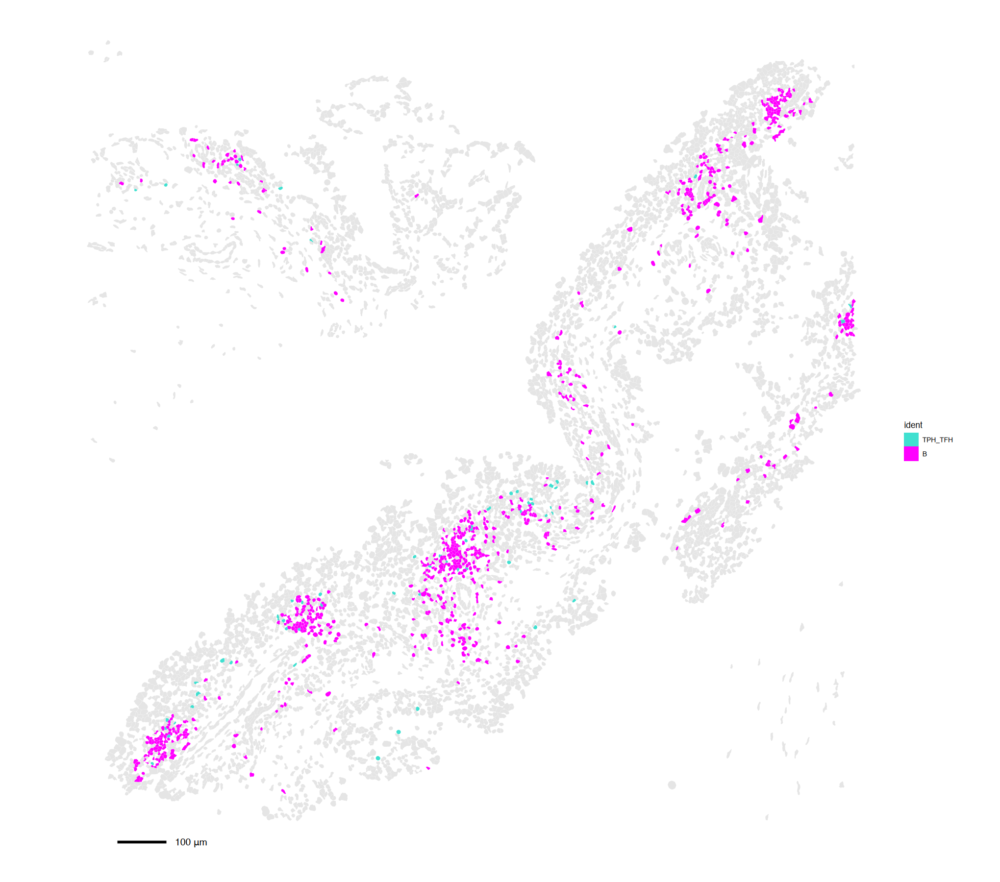

[1] "SB19:TLS-cluster46"


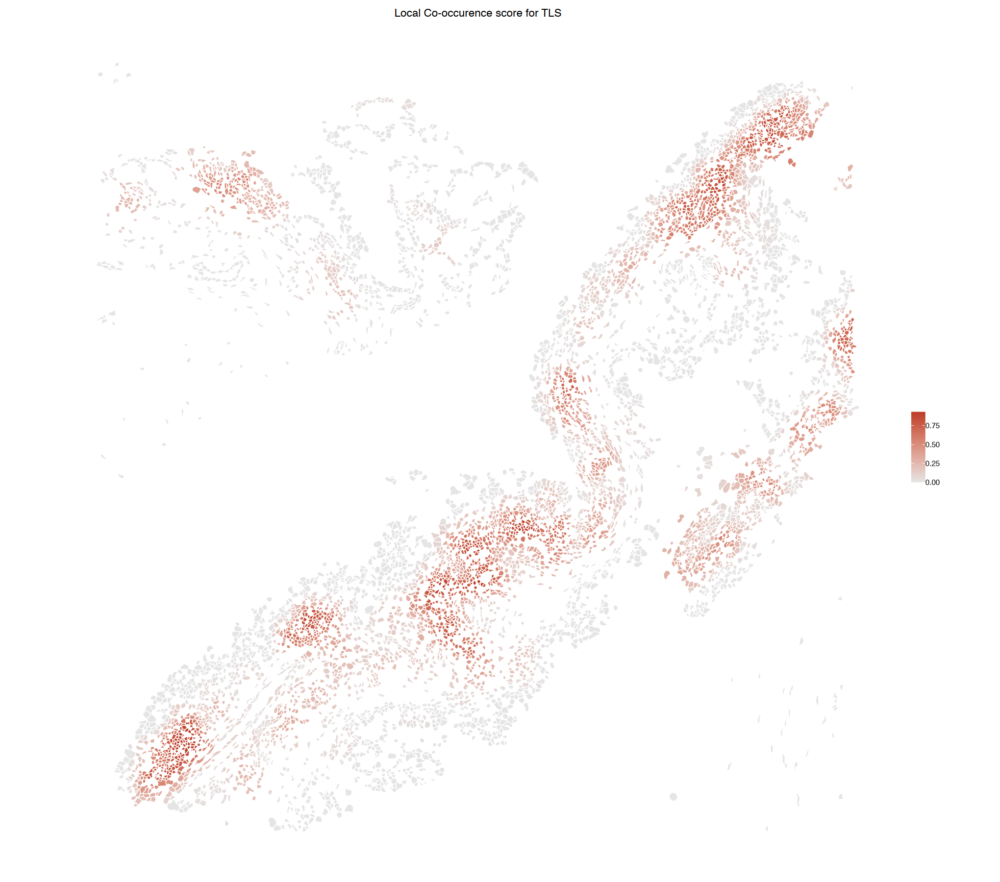

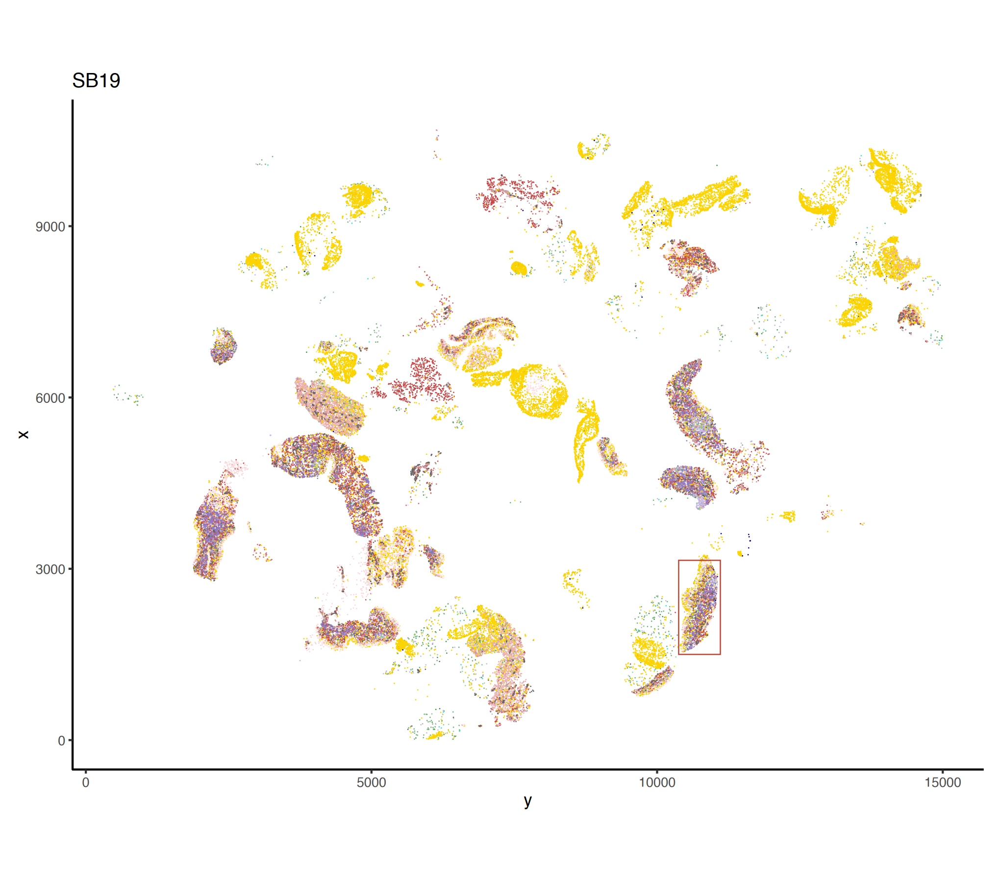

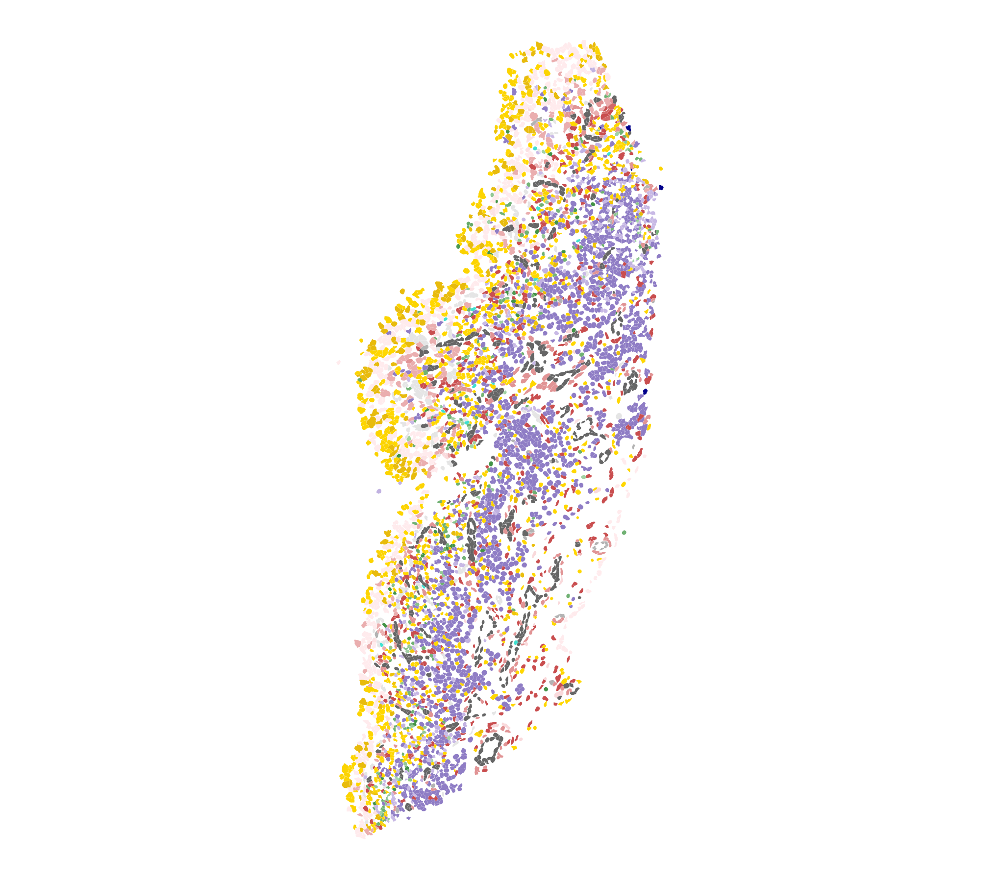

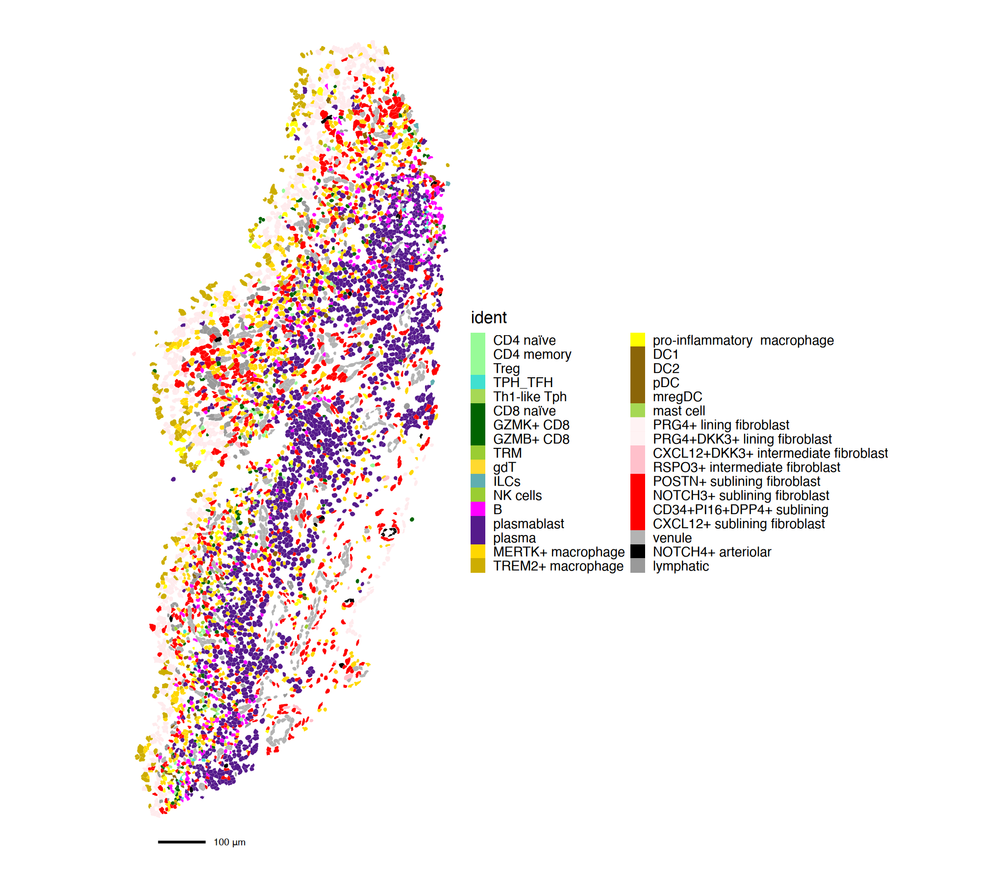

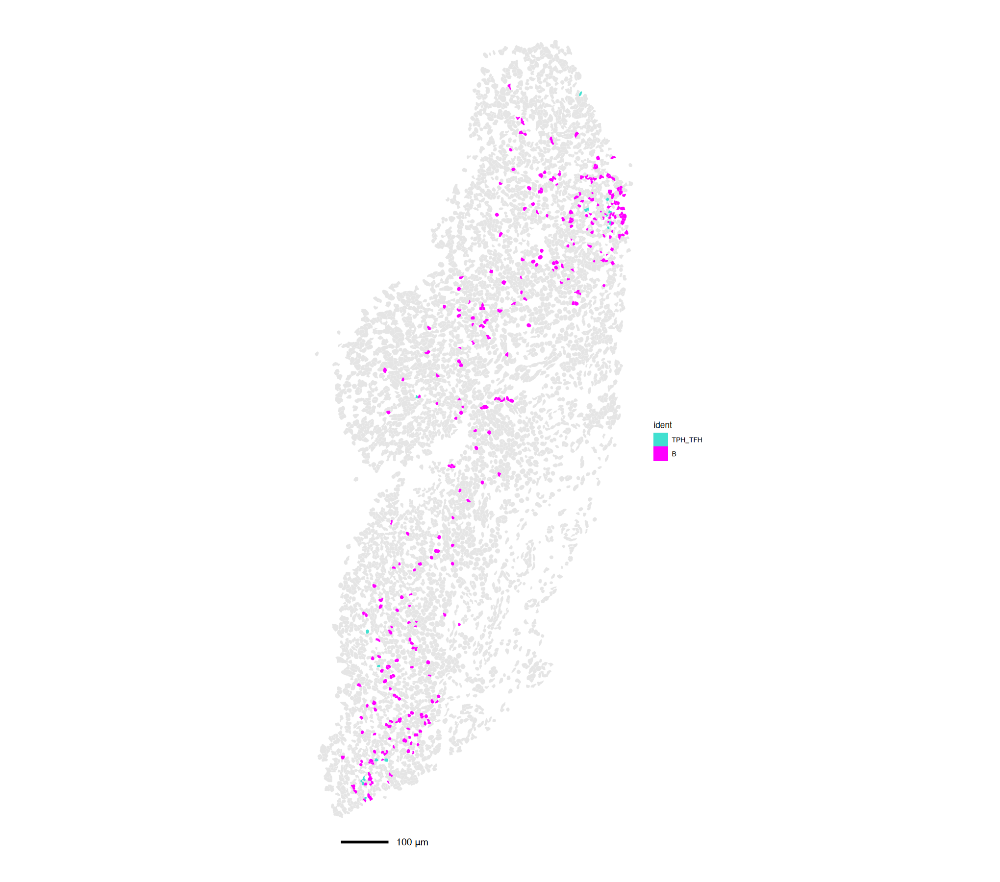

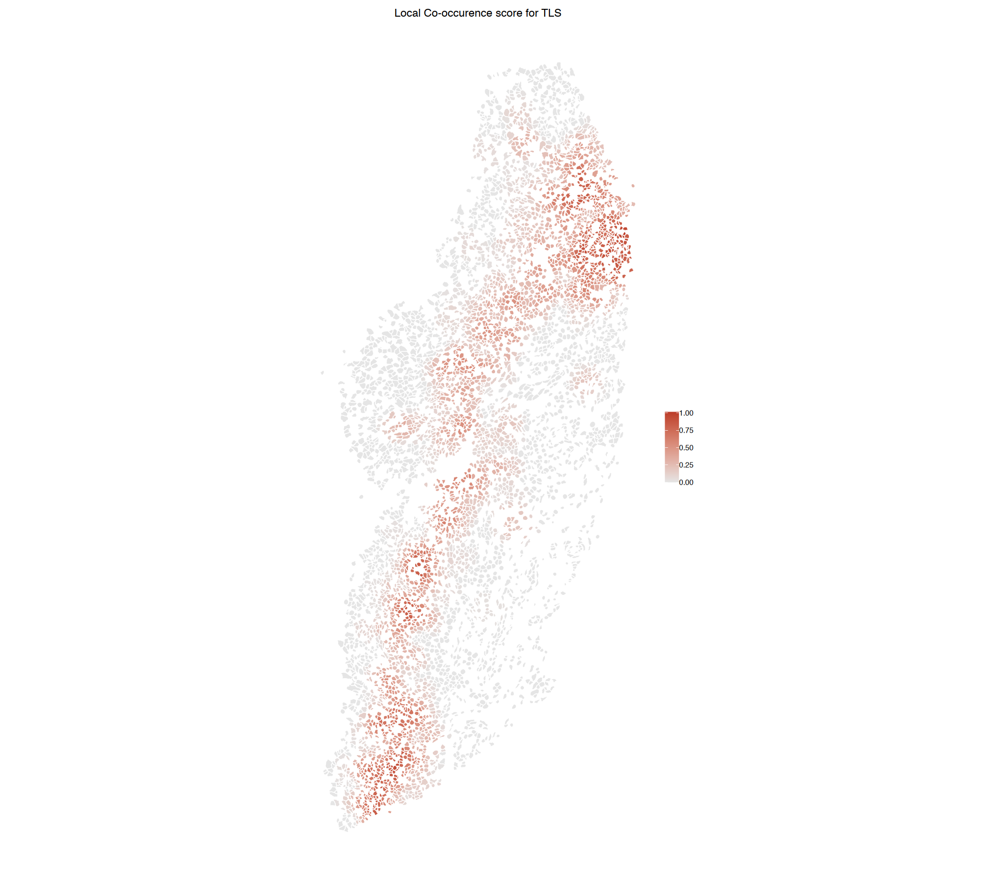

In [10]:
options(repr.plot.width = 17, repr.plot.height = 15)


marginal_dist = 50 # margins to crop the area around the TLS candidate
#clu="SB19:TLS-cluster26"
#clu="SB21:TLS-cluster61"
top_regions = head(names(sort(table(tls_df$cluster_id), decreasing = T)),3)
for(clu in top_regions){
  print(clu)
  # ste@meta.data[tls_df[tls_df$cluster_id == clu,"cell_id"],c(grep("^cooccur",colnames(ste@meta.data),value = TRUE,invert=TRUE),column_cooccur_score),]
  
  sample_id_ = tls_df[tls_df$cluster_id == clu, "sample_id"] %>% unique()
  x_lower = min(ste[[sample_id_]]$centroids@coords[,1])
  x_upper = max(ste[[sample_id_]]$centroids@coords[,1])
  y_lower = min(ste[[sample_id_]]$centroids@coords[,2])
  y_upper = max(ste[[sample_id_]]$centroids@coords[,2])
  x_min_ = tls_df[tls_df$cluster_id == clu, "x_min"] %>% unique() %>% - marginal_dist %>% ceiling()
  if(x_min_ < x_lower) x_min_ = x_lower
  x_max_ = tls_df[tls_df$cluster_id == clu, "x_max"] %>% unique()  %>% + marginal_dist %>% ceiling()
  if(x_max_ > x_upper) x_max_ = x_upper
  y_min_ = tls_df[tls_df$cluster_id == clu, "y_min"] %>% unique()  %>% - marginal_dist %>% ceiling()
  if(y_min_ < y_lower) y_min_ = y_lower
  y_max_ = tls_df[tls_df$cluster_id == clu, "y_max"] %>% unique()  %>% + marginal_dist %>% ceiling()
  if(y_max_ > y_upper) y_max_ = y_upper
  cropped.coords <- Crop(ste[[sample_id_]], x = c(x_min_, x_max_), y = c(y_min_, y_max_), coords = "tissue")
  ste[["zoom"]] <- cropped.coords
  DefaultBoundary(ste[["zoom"]]) <- "segmentation"
  
  ste_ = subset(ste, cells = Cells(ste[["zoom"]]))
  
  clus = ste@meta.data[tls_df[tls_df$cluster_id == clu,"cell_id"],c(grep("^cooccur",colnames(ste@meta.data),value = TRUE,invert=TRUE),column_cooccur_score),] %>%
    .[,cluster_col] %>% 
    as.character() %>%
    unique()
  cluster_COLORS___ = manual_colors
  names(cluster_COLORS___) = clus
  cluster_COLORS___ = na.omit(cluster_COLORS___)
  
  coords =  ste[["zoom"]]$centroids@coords %>%
    as.data.frame()

  cluster_COLORS__others = manual_colors 
  names(cluster_COLORS__others) = setdiff(levels(Idents(ste_)),names(cluster_COLORS___))
  cluster_COLORS___ = c(cluster_COLORS___, cluster_COLORS__others)
  cluster_COLORS___[grep("sublining",names(cluster_COLORS___))] = "red"
  cluster_COLORS___[grep(" lining",names(cluster_COLORS___))] = "#FFEBED99"
  cluster_COLORS___[grep("intermediate fibroblast",names(cluster_COLORS___))] = "pink"
  cluster_COLORS___[grep("arteriolar",names(cluster_COLORS___))] = "black"
  cluster_COLORS___[grep("venule",names(cluster_COLORS___))] = "grey70"
  cluster_COLORS___[grep("DC",names(cluster_COLORS___))] = "darkgoldenrod4"
  cluster_COLORS___[grep("FDC",names(cluster_COLORS___))] = "darkorange"
  cluster_COLORS___[grep("MERTK",names(cluster_COLORS___))] = "gold1"
  cluster_COLORS___[grep("TREM",names(cluster_COLORS___))] = "gold3"
  cluster_COLORS___[grep("pro-inflammatory",names(cluster_COLORS___))] = "yellow"
  cluster_COLORS___[grep("plasma",names(cluster_COLORS___))] = "purple4"
  cluster_COLORS___[grep("^B$",names(cluster_COLORS___))] = "magenta"
  cluster_COLORS___[grep("CD4|TPH_TFH|Treg",names(cluster_COLORS___))] = "palegreen"
  cluster_COLORS___[grep("CD8",names(cluster_COLORS___))] = "darkgreen"
  cluster_COLORS___[grep("TPH_TFH",names(cluster_COLORS___))] = "turquoise"
  cluster_COLORS___[grep("gd T|TRM|NK cells",names(cluster_COLORS___))] = "yellowgreen"
  cluster_COLORS___[grep("proliferating",names(cluster_COLORS___))] = NA
  cluster_COLORS___[grep("mixed",names(cluster_COLORS___))] = NA
  cluster_COLORS___[grep("muscle",names(cluster_COLORS___))] = NA
  cluster_COLORS___ = cluster_COLORS___[!is.na(names(cluster_COLORS___))]
  cluster_COLORS___ = na.omit(cluster_COLORS___)
  ste_ = subset(ste_, ident = names(cluster_COLORS___))
  
  g1 = ImageDimPlot(ste_, 
                    fov = "zoom", 
                    #axes = TRUE, 
                    cols = cluster_COLORS___,
                    #cols = "glasbey",
                    #cols = cluster_COLORS, 
                    size = 0.1, 
                    border.color = "grey90",
                    border.size = 0.001,
                    na.value = "grey90",
                    dark.background = F) &
    theme_void(base_size = 20) &
    annotate("segment", x = min(coords$y) + 50, xend = min(coords$y) + 150, 
             y = min(coords$x) - 50, yend = min(coords$x) - 50, 
             color = "black", size = 1.2) &
    annotate("text", x = min(coords$y) + 200, y = min(coords$x) - 50, 
             label = "100 μm", size = 4)
  
  cluster_COLORS___sel = cluster_COLORS___
  cluster_COLORS___sel[!names(cluster_COLORS___sel)%in%c("TPH_TFH","FDC","B")]="grey80"
  cluster_COLORS___sel = cluster_COLORS___sel[c("TPH_TFH","FDC","B")]
  g1_sel = ImageDimPlot(ste_,
                    fov = "zoom", 
                    #axes = TRUE, 
                    cols = cluster_COLORS___sel,
                    #cols = "glasbey",
                    #cols = cluster_COLORS, 
                    size = 0.1, 
                    border.color = "grey90",
                    border.size = 0.001,
                    na.value = "grey90",
                    dark.background = F) &
    theme_void(base_size = 10) &
    annotate("segment", x = min(coords$y) + 50, xend = min(coords$y) + 150, 
             y = min(coords$x) - 50, yend = min(coords$x) - 50, 
             color = "black", size = 1.2) &
    annotate("text", x = min(coords$y) + 200, y = min(coords$x) - 50, 
             label = "100 μm", size = 4)
  
  g1_ = ImageDimPlot(ste, 
                     fov = "zoom", 
                     #axes = TRUE, 
                     cols = cluster_COLORS__, 
                     #cols = "glasbey",
                     #cols = cluster_COLORS, 
                     size = 1.5, 
                     border.color = "grey90",
                     border.size = 0.001,
                     dark.background = F) &
    theme_void(base_size = 20) &
    theme(legend.text = element_text(size = 10),
          legend.title = element_blank(),
          legend.position = "none")
  
  g2 <- ImageDimPlot(ste,
                     #axes = TRUE, 
                     fov = sample_id_, 
                     cols = cluster_COLORS__, 
                     size = 0.5, 
                     border.color = "grey90",
                     border.size = 0.001,
                     dark.background = F) & 
    theme_classic2(base_size = 20) &
    theme(legend.text = element_text(size = 10),
          legend.title = element_blank(),
          legend.position = "none")
  
  g2 <- g2 +
    annotate(
      "rect",
      xmin = y_min_,
      xmax = y_max_,
      ymin = x_min_,
      ymax = x_max_,
      color = "#BC3C29FF",   
      fill = NA,      
      size = 0.5,     
      linetype = "solid"
    ) +
    ggtitle(sample_id_)
  
  base::plot((g2))
  base::plot((g1_))
  base::plot((g1))
  base::plot((g1_sel))
  
  g5 = ImageFeaturePlot(ste_, 
                        features = "cooccur_local_B_T", 
                        fov = "zoom", 
                        cols = c("grey90", "#BC3C29FF"), dark.background = F) &
    ggtitle(paste0("Local Co-occurence score for TLS")) &
    scale_color_gradient(low = "grey90", high = "#BC3C29FF") &
    theme(legend.position = "right",
          legend.title = element_text(size = 0)) &
    guides(color = guide_legend(override.aes = list(size=5,
                                                    alpha = 1),
                                title = "Co-occurence",
                                ncol = 1))
  base::plot((g5))
  
}


Association between distance to nearest B cells and proportion of cells

,cell_id,x,y,cluster_id,celltype,x_min,x_max,y_min,y_max,n_all_cells
,<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,SB4_ahanmfbi-1,7151.450,6128.849,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917
2,SB4_ahecmgda-1,7049.578,6025.897,SB4:TLS-cluster7,M,6911.603,7579.947,5995.073,6472.643,917
3,SB4_aheedlod-1,7041.330,6025.482,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917
4,SB4_ahehihfd-1,7086.972,6082.307,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917
5,SB4_aheklpjf-1,7063.858,6031.318,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917
6,SB4_ahepbkao-1,7064.182,6042.625,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917
7,SB4_ahfemkan-1,7078.812,6040.318,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917
8,SB4_ahfhljch-1,7085.265,6029.953,SB4:TLS-cluster7,T,6911.603,7579.947,5995.073,6472.643,917
9,SB4_ahfloajk-1,7066.828,5996.795,SB4:TLS-cluster7,Tissue,6911.603,7579.947,5995.073,6472.643,917


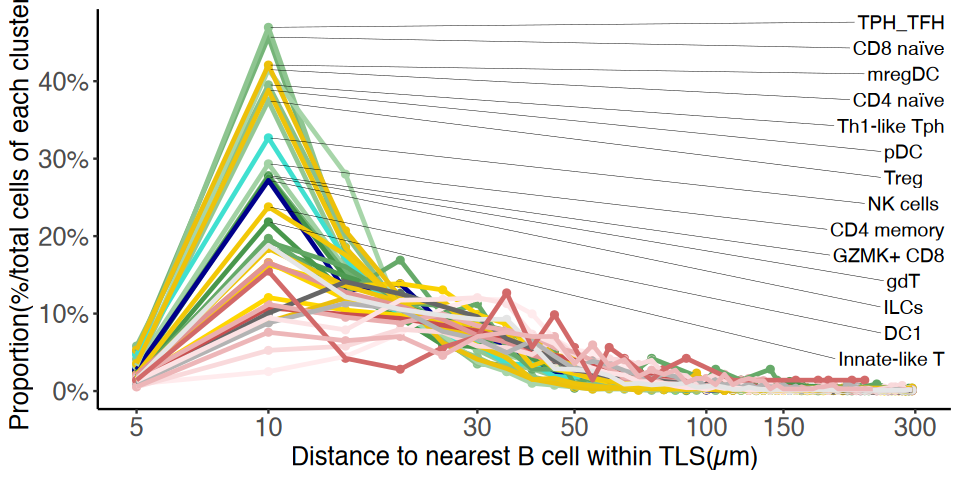

In [11]:
tls_df_ = tls_df %>%
  dplyr::left_join(.,
                   ste@meta.data[,c("cell","new_cluster")],
                   by=c("cell_id" = "cell")
  ) %>%
  dplyr::filter(new_cluster!="mixed") %>%
  dplyr::filter(new_cluster!="muscle") %>%
  dplyr::filter(new_cluster!="proliferating cells")


coords_df = data.frame()
for (name in c("SB4","SB14","SB10","SB19","SB25","SB21","SB29","SB30","SB62")) {
  b_cells <- tls_df_ %>% dplyr::filter(new_cluster == "B")
  
  nonb_cells <- tls_df_ %>% dplyr::filter(celltype != "B")
  res <- RANN::nn2(data = b_cells[,c("x","y")], 
                   query = nonb_cells[,c("x","y")], 
                   searchtype = "radius",
                   radius     = 300,
                   k = 1)
  nonb_cells$dist_nearest_b <- res$nn.dists[, 1]  
  
  coords_df = rbind(coords_df, nonb_cells)
}
coords_df = coords_df %>%
  dplyr::filter(dist_nearest_b < 300)
coords_df[1:10,1:10]
coords_df$dist_nearest_b <- as.numeric(coords_df$dist_nearest_b)

bin_breaks <- seq(0, 300, by = 5)
coords_df <- coords_df %>%
  dplyr::mutate(dist_bin = cut(dist_nearest_b, breaks = bin_breaks, include.lowest = TRUE, right = FALSE))

summary_df <- coords_df %>%
  dplyr::group_by(new_cluster) %>%
  dplyr::mutate(total_cells = n()) %>%
  dplyr::group_by(new_cluster, dist_bin) %>%
  dplyr::summarise(
    prop = n()/total_cells,
    dist_mean   = mean(dist_nearest_b),
    bin_upper = as.numeric(gsub(".*,([^]]+)\\)", "\\1", dist_bin)),
    n          = n(),
    .groups = "drop"
  ) %>%
  dplyr::ungroup() %>%
  unique()

max_label_df <- summary_df %>%
  dplyr::group_by(new_cluster) %>%
  dplyr::filter(prop == max(prop, na.rm = TRUE)) %>%
  dplyr::slice(1) %>%  
  dplyr::filter(prop > 0.2) %>%
  dplyr::ungroup() %>%
  dplyr::arrange(desc(prop)) %>%
  dplyr::mutate(label_x = 100,  
                label_y = seq(from = max(prop) * 1.05,  
                              by = -max(prop) * 0.05,
                              length.out = n()))
g = ggplot(summary_df, aes(x =  bin_upper, y = prop, color = new_cluster)) +
  geom_point() +
  geom_line(size = 1) +    
  geom_text_repel(
    data = max_label_df,
    aes(label = new_cluster),
    size = 4,
    nudge_x           = 1.45,
    min.segment.length = 0,
    direction = "y",
    hjust = 0.5,
    color = "black",
    segment.color = "black",
    segment.size = 0.1,
    show.legend = FALSE,
    max.overlaps = Inf
  ) +
  scale_x_log10(breaks = c(1,5,10,30,50,100,150,300)) + 
  scale_y_continuous(labels = scales::percent_format(scale = 100)) +
  scale_color_manual(values = cluster_COLORS__) +
  labs(
    x = "Distance to nearest B cell within TLS(µm)",
    y = "Proportion(%/total cells of each cluster)",
    color = ""
  ) +
  theme_classic() +
  theme(
    legend.position = "none",
    axis.text.x = element_text(size=15),
    axis.text.y = element_text(size=15),
    axis.title.x = element_text(size=15),
    axis.title.y = element_text(size=15),
    plot.title = element_text(size=15)
  ) 

options(repr.plot.width = 8, repr.plot.height = 4)
plot(g)